In [47]:
import scanpy as sc
import harmonypy as hm
import pandas as pd
import anndata as ad
import numpy as np
import scrublet as scr
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

random_State = 7

In [46]:
adata = sc.read("/data/BCI-SingleCell/SCC_Atlas/Sam_Nicholls/Combined_adata_object.h5ad")
TSK_score = pd.read_csv("TSK_AUC_score.csv", index_col=0)

In [43]:
adata.raw.shape

(335125, 46209)

In [48]:
adata.obs = pd.concat([adata.obs, TSK_score], axis=1)

In [17]:
from scipy import io
# If your count_matrix is a pandas DataFrame, convert to scipy sparse matrix first:
from scipy import sparse

# Transpose to get genes as rows, cells as columns
expr_matrix = pd.DataFrame(
    adata.X.T.toarray() if hasattr(adata.X, "toarray") else adata.X.T,
    index=adata.var_names,     # genes (rows)
    columns=adata.obs_names    # cells (columns)
)

io.mmwrite('/data/BCI-SingleCell/SCC_Atlas/Sam_Nicholls/AUCell_input.mtx', sparse_matrix)

In [ ]:
count_matrix = pd.DataFrame(adata.X, index=adata.obs.index, columns=adata.var.index)

from scipy import io

# If your count_matrix is a pandas DataFrame, convert to scipy sparse matrix first:
from scipy import sparse

# Example: if count_matrix is a DataFrame
sparse_matrix = sparse.csr_matrix(count_matrix.values)

# Save as Matrix Market
io.mmwrite('/data/BCI-SingleCell/SCC_Atlas/Sam_Nicholls/cSCC_full.mtx', sparse_matrix)

# Save gene names (row names) to genes.txt
count_matrix.index.to_series().to_csv('genes.txt', index=False, header=False)

# Save barcodes (column names) to barcodes.txt
pd.Series(count_matrix.columns).to_csv('barcodes.txt', index=False, header=False)

In [15]:
count_matrix

,7SK.2,A2M,ABCA8,ABCC9,AC002064.4,AC002331.1,AC002398.12,AC003973.4,AC003986.7,AC004023.1,...,XXyac-YM21GA2.7,Y-RNA.1,Z83001.1,ZBP1,ZBTB20-AS3,ZBTB20-AS5,ZDHHC22,ZNF683,ZNF80,hsa-mir-150
AAACCTGAGAAACCTA,-0.590046,-0.395971,-0.195649,-0.202466,-0.005683,-0.173860,-0.020445,-0.005251,-0.034150,-0.001561,...,-0.004438,-0.026467,-0.007615,-0.275551,-0.006616,-0.003422,-0.006565,-0.134102,-0.080060,-0.019220
AAACCTGAGCATCATC,-0.265562,0.574547,-0.106657,-0.093321,-0.003345,-0.096022,-0.009279,-0.002700,-0.017032,0.001456,...,-0.000384,-0.013548,-0.004397,-0.134379,-0.002993,0.011769,-0.001520,-0.063799,-0.032283,-0.008027
AAACCTGAGCGGATCA,-0.549777,-0.381975,-0.186827,-0.194723,-0.005191,-0.161764,-0.018822,-0.004855,-0.031263,-0.001588,...,-0.004171,-0.024548,-0.007090,-0.257694,-0.006180,-0.004665,-0.006080,-0.125531,-0.075012,-0.017842
AAACCTGAGCTCAACT,-0.285352,-0.237234,1.548848,2.955525,-0.003742,-0.103834,-0.010258,-0.002957,-0.019036,0.001778,...,-0.000335,-0.014734,-0.004751,-0.143413,-0.003198,0.014778,-0.001649,-0.067894,-0.034088,-0.008695
AAACCTGAGCTCCTTC,-0.582004,-0.407387,8.119361,-0.214692,-0.005105,-0.165661,-0.019558,-0.004982,-0.031762,-0.002520,...,-0.004944,-0.025333,-0.007212,-0.271183,-0.006561,-0.011096,-0.006804,-0.132754,-0.081144,-0.018973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCAGTGTATC-1,0.020334,-0.162624,-0.054059,-0.064557,0.001067,0.000864,0.003311,0.000477,0.006915,-0.000552,...,0.000448,0.001505,-0.000105,-0.006074,0.000044,-0.011187,0.001283,-0.003638,-0.000426,0.001697
TTTGTTGGTCAGGTAG-1,-0.137077,-0.389768,-0.152534,-0.261924,0.004970,0.023749,0.003793,0.001233,0.017604,-0.012015,...,-0.007389,0.003103,0.001455,-0.066158,-0.002044,-0.096421,-0.004685,-0.041560,-0.045540,-0.004029
TTTGTTGTCCCATTCG-1,-0.273327,-0.347253,-0.149033,-0.201031,0.000266,-0.053751,-0.005254,-0.001311,-0.003620,-0.005893,...,-0.004753,-0.008134,-0.002203,-0.131644,-0.003321,-0.045259,-0.004202,-0.068259,-0.049391,-0.008510
TTTGTTGTCTCTATAC-1,-0.318813,-0.333041,-0.147858,-0.180684,-0.001306,-0.079631,-0.008275,-0.002161,-0.010707,-0.003848,...,-0.003872,-0.011886,-0.003424,-0.153507,-0.003747,-0.028170,-0.004040,-0.077172,-0.050673,-0.010006


In [50]:
adata

AnnData object with n_obs × n_vars = 335125 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Condition', 'Patient_ID', 'level1_celltype', 'level2_celltype', 'level3_celltype', 'treatment', 'cluster', 'UMAP1', 'UMAP2', 'Dataset', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'doublet_scores', 'predicted_doublets', 'clusters_r06', 'clusters_r04', 'clusters_r02', 'original_barcodes', 'celltypist_labels', 'Cell_type', 'AUC_score', 'assignment'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'Condition_colors', 'Dataset_colors', 'Patient_ID_colors', 'batch_colors', 'celltypist_labels_colors', 'clu

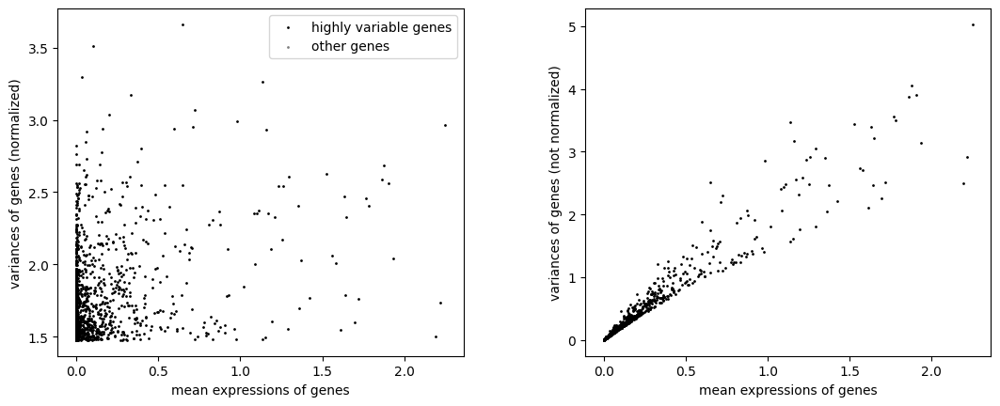

In [51]:
sc.pl.highly_variable_genes(adata)

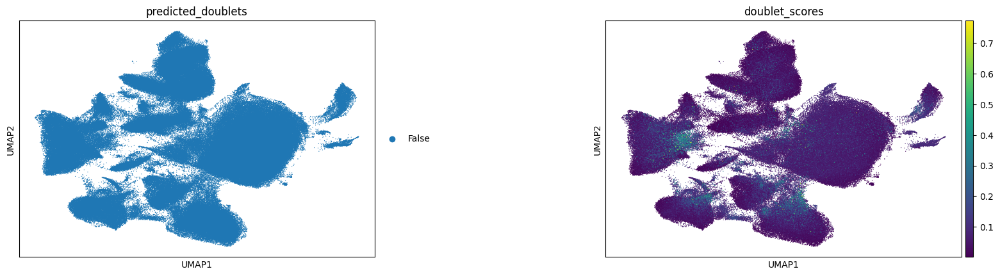

In [5]:
sc.pl.umap(
    adata,
    color=["predicted_doublets", "doublet_scores"],
    # increase horizontal space between panels
    wspace=0.5,
    size=3,
)

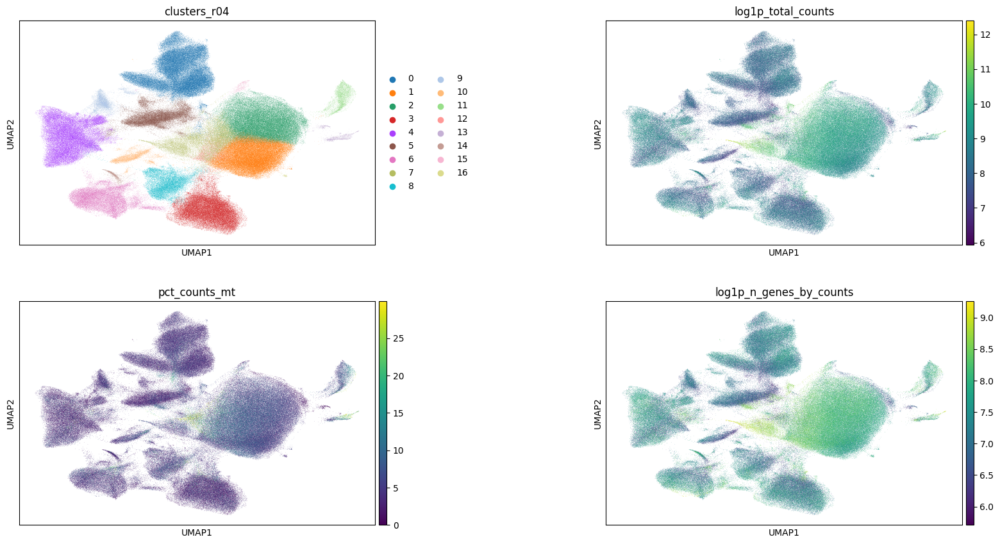

In [6]:
sc.pl.umap(
    adata,
    color=["clusters_r04", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
)

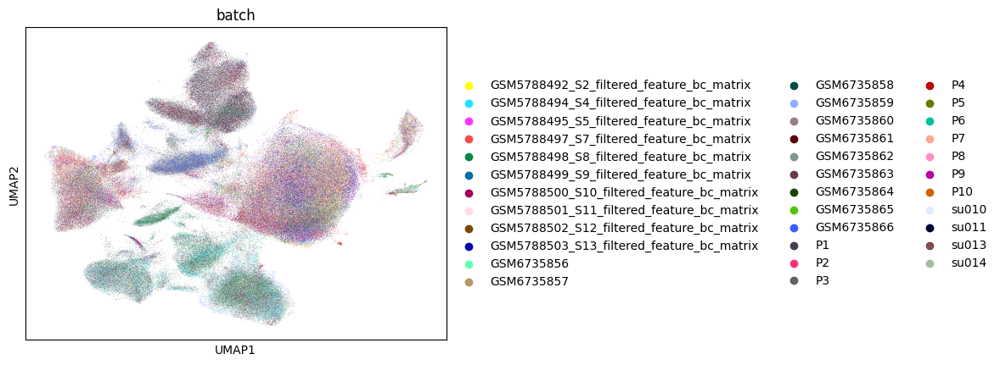

In [7]:
sc.pl.umap(adata, color = ['batch'])

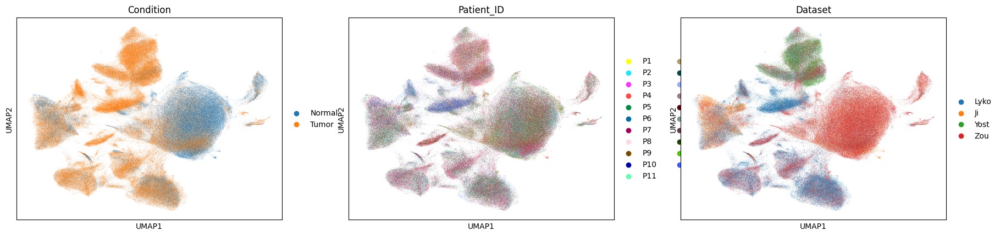

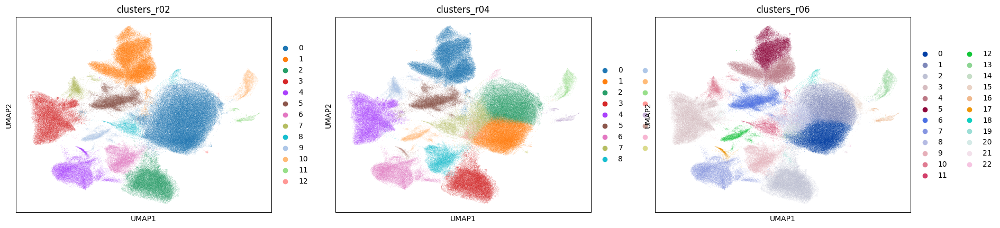

In [8]:
sc.pl.umap(adata, color = ['Condition', 'Patient_ID', 'Dataset'])
sc.pl.umap(adata, color = ['clusters_r02', 'clusters_r04', 'clusters_r06'])

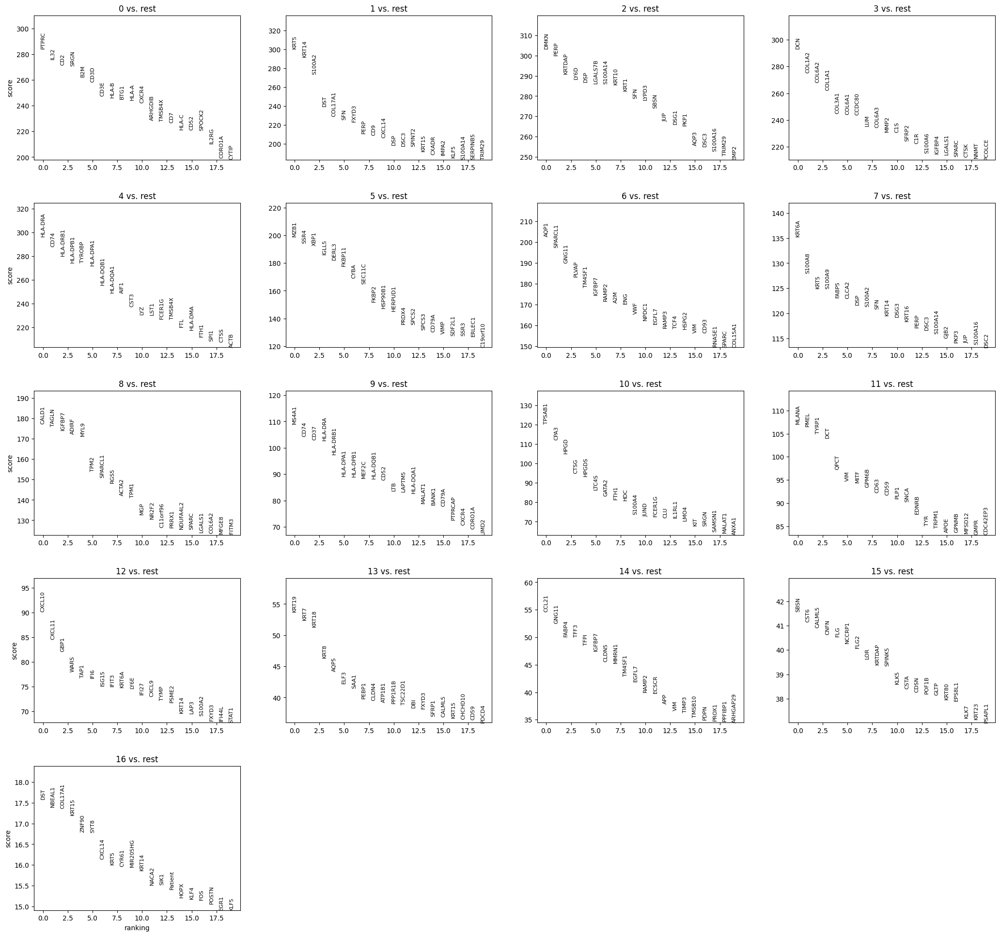

In [9]:
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [23]:
#Celltypist annotations (not very good)
import celltypist
from celltypist import models

#Downloaad skin model
models.download_models(model = 'Adult_Human_Skin.pkl')
Skin_Model = models.Model.load(model = 'Adult_Human_Skin.pkl')

#Making names unique is reuired for celltypist
adata.obs['original_barcodes'] = adata.obs_names
adata.obs_names_make_unique()

predictions = celltypist.annotate(adata, model=Skin_Model, majority_voting=True)

📂 Storing models in /data/home/ha20577/.celltypist/data/models
💾 Total models to download: 1
⏩ Skipping [1/1]: Adult_Human_Skin.pkl (file exists)
👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 335125 cells and 46209 genes
🔗 Matching reference genes in the model
🧬 3224 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 30
🗳️ Majority voting the predictions
✅ Majority voting done!


In [24]:
adata.obs['celltypist_labels_abrv'] = predictions.predicted_labels['predicted_labels']

In [25]:
adata.obs['celltypist_labels_abrv'].cat.categories

Index(['DC1', 'DC2', 'Differentiated_KC', 'F1', 'F2', 'F3', 'ILC1_3',
       'ILC1_NK', 'ILC2', 'Inf_mac', 'LC', 'LE1', 'LE2', 'Macro_1', 'Macro_2',
       'Mast_cell', 'Melanocyte', 'MigDC', 'Mono_mac', 'NK', 'Pericyte_1',
       'Pericyte_2', 'Plasma', 'Schwann_1', 'Schwann_2', 'Tc', 'Th', 'Treg',
       'Undifferentiated_KC', 'VE1', 'VE2', 'VE3', 'migLC', 'moDC'],
      dtype='object')

In [26]:
#Renaming the abbreviations to cell types as noted in the original article: Gary Reynolds DOI: 10.1126/science.aba6500
adata.obs['celltypist_labels'] = adata.obs['celltypist_labels_abrv'].map({
    'DC1':'Dendritic Cell',
    'DC2':'Dendritic Cell',
    'Differentiated_KC' : 'Differentiated Keratinocyte',
    'F1':'Fibroblast',
    'F2':'Fibroblast',
    'F3':'Fibroblast',
    'ILC1_3':'Innate lymphoid cell',
    'ILC1_NK':'Innate lymphoid cell / NK Cell',
    'ILC2':'Innate lymphoid cell',
    'Inf_mac': 'Inflammatory Macrophage',
    'LC':'Langerhans Cell',
    'LE1':'lymphatic endothelium',
    'LE2':'lymphatic endothelium',
    'Macro_1':'Macrophage',
    'Macro_2':'Macrophage',
    'Mast_cell':'Mast Cell',
    'Melanocyte':'Melanocyte',
    'MigDC':'Migratory Dendritic Cell',
    'Mono_mac':'Monocyte derived macrophage',
    'NK':'NK Cell',
    'Pericyte_1':'Pericyte',
    'Pericyte_2':'Pericyte',
    'Plasma':'Plasma Cell',
    'Schwann_1':'Schwann Cell',
    'Schwann_2':'Schwann Cell',
    'Tc':'Cytotoxic T Cell',
    'Th':'T helper cell',
    'Treg':'Regulatory T Cell',
    'Undifferentiated_KC':'Undifferentiated Keratinocyte',
    'VE1':'Vascular Endothelium',
    'VE2':'Vascular Endothelium',
    'VE3':'Vascular Endothelium',
    'migLC':'Migratory Langerhans Cell',
    'moDC':'Monocyte Derived Dendritic Cell'
})

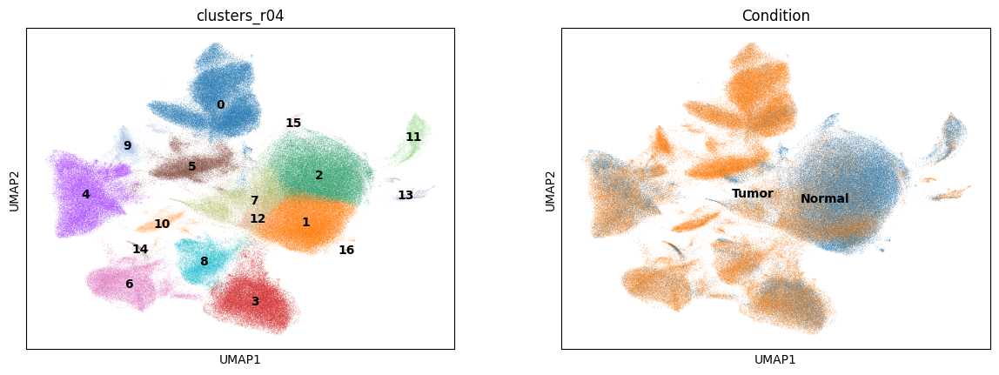

In [31]:
sc.pl.umap(adata, color=['clusters_r04', "Condition"], legend_loc='on data')

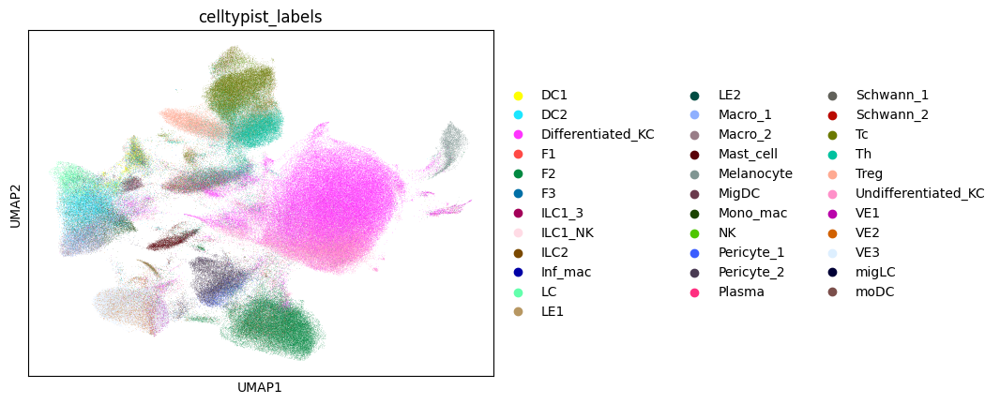

In [52]:
sc.pl.umap(adata, color = 'celltypist_labels')

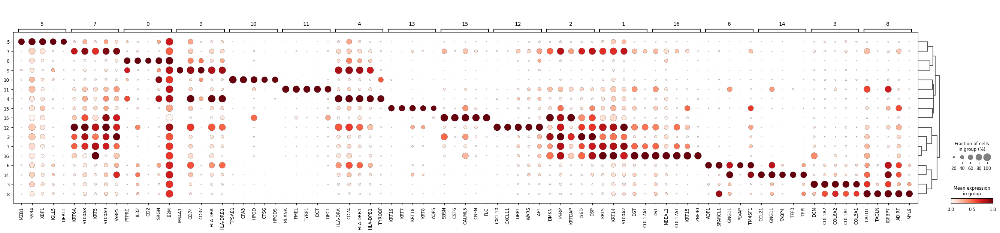

In [14]:
#Manual annotation using dotplots, I will search google for marker gene cell types
sc.pl.rank_genes_groups_dotplot(adata, groupby = 'clusters_r04', standard_scale = 'var', n_genes = 5)

In [15]:
#There is some overlap between clusters so filtering to make more precise
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.4,
    key_added="dea_filtered",
)

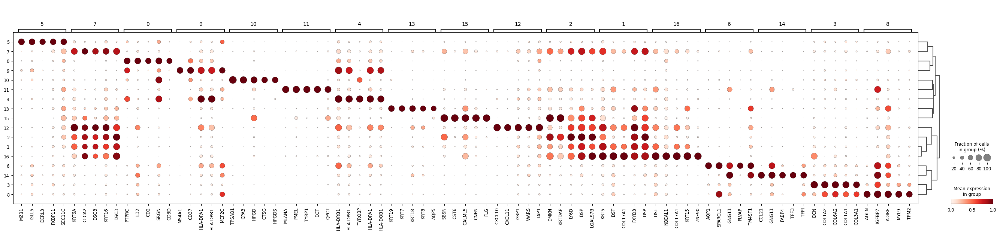

In [16]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="clusters_r04",
    standard_scale="var",
    n_genes=5,
    key="dea_filtered",
)

In [17]:
# Get top 5 DE genes per cluster
top_de_genes = {}

for group in adata.uns['dea_filtered']['names'].dtype.names:
    df = sc.get.rank_genes_groups_df(adata, group=group).head(5)
    top_de_genes[group] = df['names'].tolist()

# Print results
for cluster, genes in top_de_genes.items():
    print(f"Cluster {cluster}: {genes}")

Cluster 0: ['PTPRC', 'IL32', 'CD2', 'SRGN', 'B2M']
Cluster 1: ['KRT5', 'KRT14', 'S100A2', 'DST', 'COL17A1']
Cluster 2: ['DMKN', 'PERP', 'KRTDAP', 'LY6D', 'DSP']
Cluster 3: ['DCN', 'COL1A2', 'COL6A2', 'COL1A1', 'COL3A1']
Cluster 4: ['HLA-DRA', 'CD74', 'HLA-DRB1', 'HLA-DPB1', 'TYROBP']
Cluster 5: ['MZB1', 'SSR4', 'XBP1', 'IGLL5', 'DERL3']
Cluster 6: ['AQP1', 'SPARCL1', 'GNG11', 'PLVAP', 'TM4SF1']
Cluster 7: ['KRT6A', 'S100A8', 'KRT5', 'S100A9', 'FABP5']
Cluster 8: ['CALD1', 'TAGLN', 'IGFBP7', 'ADIRF', 'MYL9']
Cluster 9: ['MS4A1', 'CD74', 'CD37', 'HLA-DRA', 'HLA-DRB1']
Cluster 10: ['TPSAB1', 'CPA3', 'HPGD', 'CTSG', 'HPGDS']
Cluster 11: ['MLANA', 'PMEL', 'TYRP1', 'DCT', 'QPCT']
Cluster 12: ['CXCL10', 'CXCL11', 'GBP1', 'WARS', 'TAP1']
Cluster 13: ['KRT19', 'KRT7', 'KRT18', 'KRT8', 'AQP5']
Cluster 14: ['CCL21', 'GNG11', 'FABP4', 'TFF3', 'TFPI']
Cluster 15: ['SBSN', 'CST6', 'CALML5', 'CNFN', 'FLG']
Cluster 16: ['DST', 'NBEAL1', 'COL17A1', 'KRT15', 'ZNF90']


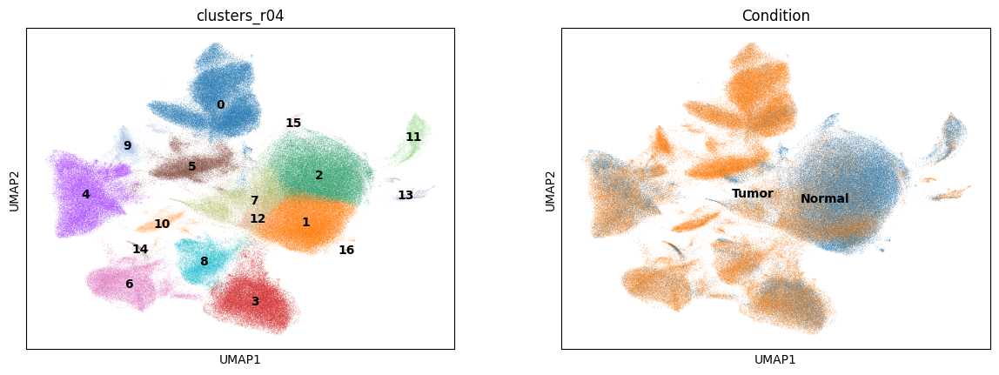

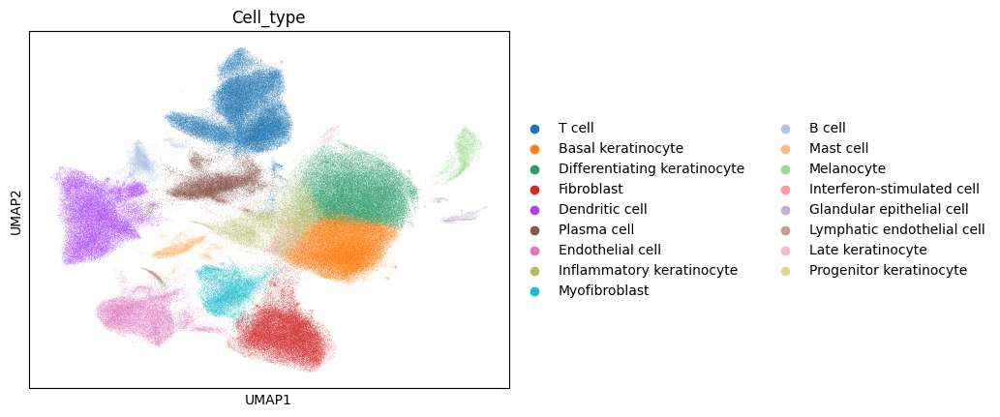

In [18]:
#ANnotation dict is chatgpt, refine later
annotation_dict ={
    "0": "T cell",
    "1": "Basal keratinocyte",
    "2": "Differentiating keratinocyte",
    "3": "Fibroblast",
    "4": "Dendritic cell",
    "5": "Plasma cell",
    "6": "Endothelial cell",
    "7": "Inflammatory keratinocyte",
    "8": "Myofibroblast",
    "9": "B cell",
    "10": "Mast cell",
    "11": "Melanocyte",
    "12": "Interferon-stimulated cell",
    "13": "Glandular epithelial cell",
    "14": "Lymphatic endothelial cell",
    "15": "Late keratinocyte",
    "16": "Progenitor keratinocyte"
}
              
#Adding the cell type to my data
adata.obs['Cell_type'] = adata.obs['clusters_r04'].map(annotation_dict).astype('category')

#Annotated UMAP
sc.pl.umap(adata, color=['clusters_r04', 'Condition'], legend_loc='on data')
sc.pl.umap(adata, color = 'Cell_type')

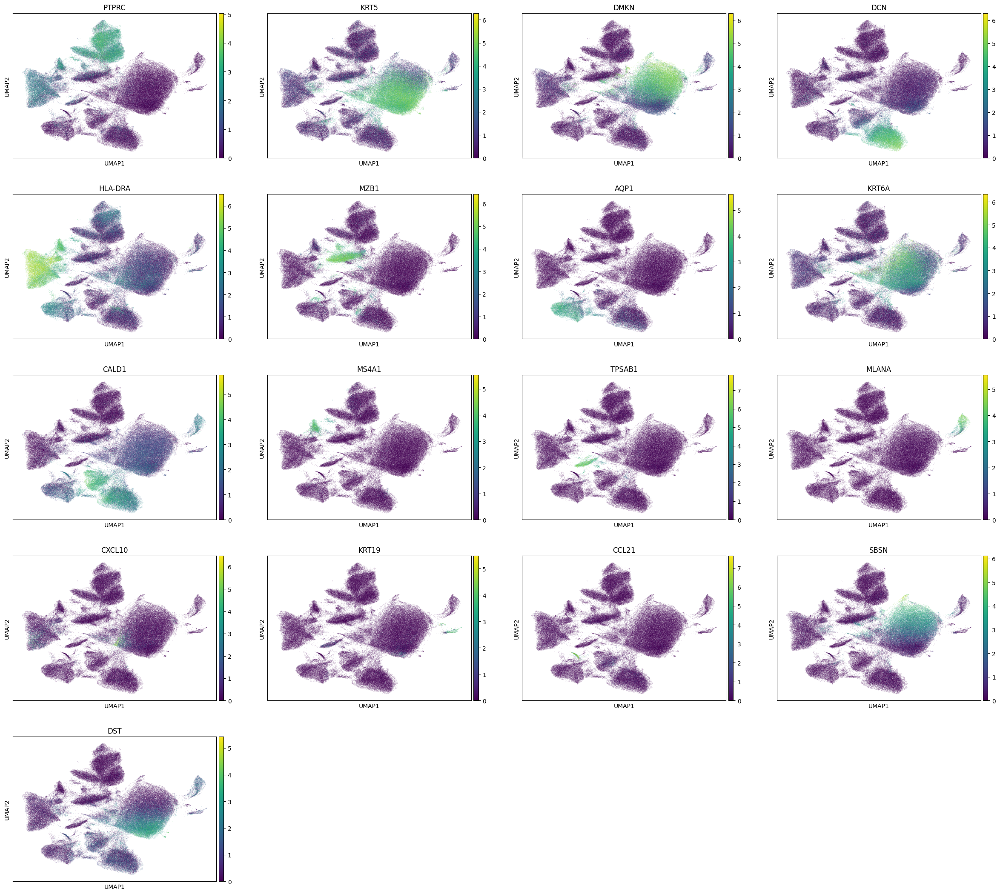

In [19]:
#Feature plot for each cell type
sc.pl.umap(adata.raw.to_adata(),
           color=[
    'PTPRC',    # T cell
    'KRT5',     # Basal keratinocyte (epithelial)
    'DMKN',     # Differentiating keratinocyte (epithelial)
    'DCN',      # Fibroblast
    'HLA-DRA',  # Dendritic cell / Antigen-presenting cell
    'MZB1',     # Plasma cell
    'AQP1',     # Endothelial cell
    'KRT6A',    # Inflammatory keratinocyte (epithelial)
    'CALD1',    # Myofibroblast / Smooth muscle cell
    'MS4A1',    # B cell
    'TPSAB1',   # Mast cell
    'MLANA',    # Melanocyte
    'CXCL10',   # Interferon-stimulated immune cell
    'KRT19',    # Glandular epithelial cell
    'CCL21',    # Lymphatic endothelial cell
    'SBSN',     # Late-stage keratinocyte (epithelial)
    'DST'       # Progenitor keratinocyte (epithelial)
]
,
           use_raw=False)

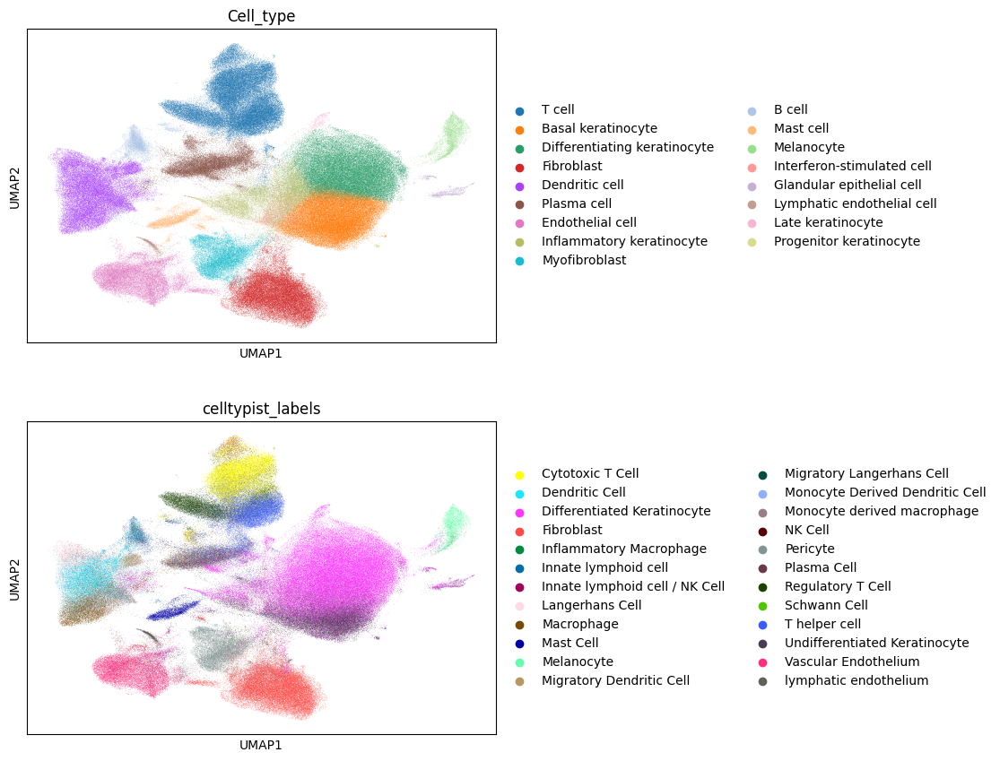

In [35]:
#Comparing Celltypist and manually annotated labels for cross referencing
sc.pl.umap(adata, color = ['Cell_type', 'celltypist_labels'], ncols=1)

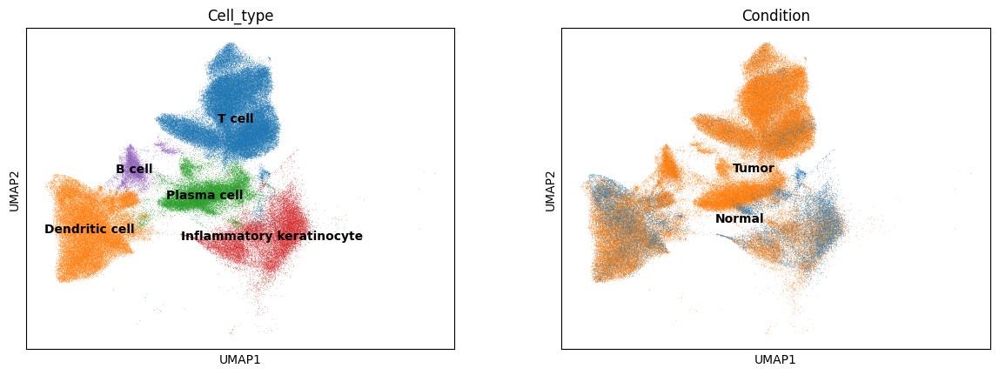

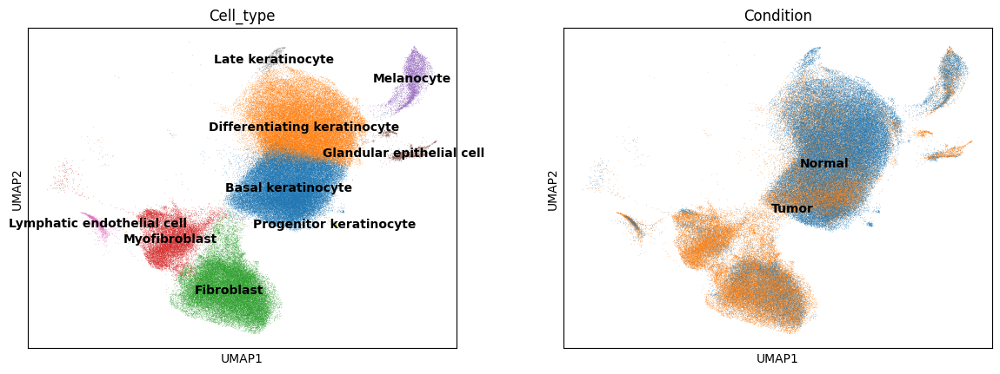

In [63]:
#Comparing normal and immune cells
#subsetting by immune cells, and non immune cells
immuneCells = ['T cell', 'B cell', 'Plasma cell', 'Dendritic cell', 'Mast Cell', "Inflammatory keratinocyte"]
immune_adata = adata[adata.obs['Cell_type'].isin(immuneCells)].copy()

#Plotting umaps
sc.pl.umap(immune_adata, color=['Cell_type', 'Condition'], legend_loc = 'on data')

#Normal Cells
normalCells = ["Basal keratinocyte", 
               "Differentiating keratinocyte",
               "Late keratinocyte", 
               'Fibroblast', 
               'Melanocyte', 
               "Myofibroblast",
               'Endothelial Cell', 
               "Glandular epithelial cell", 
               "Progenitor keratinocyte",
               "Lymphatic endothelial cell",]

normalcells_adata = adata[adata.obs['Cell_type'].isin(normalCells)].copy()

sc.pl.umap(normalcells_adata, color=['Cell_type', 'Condition'], legend_loc = 'on data')

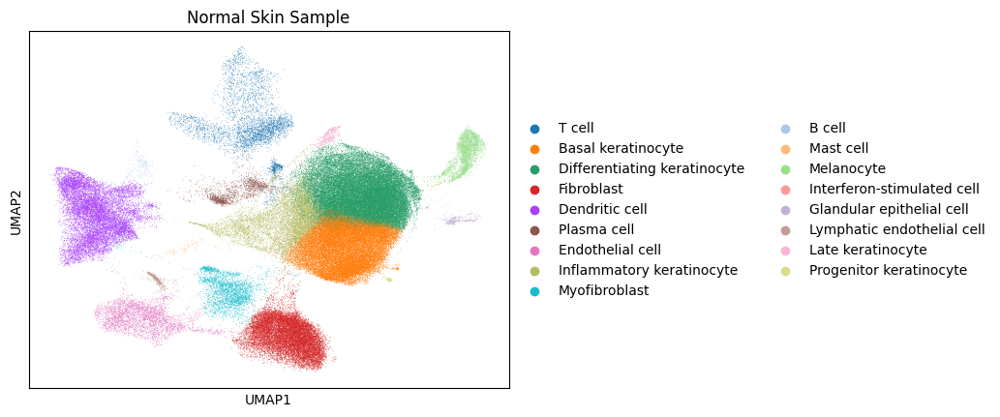

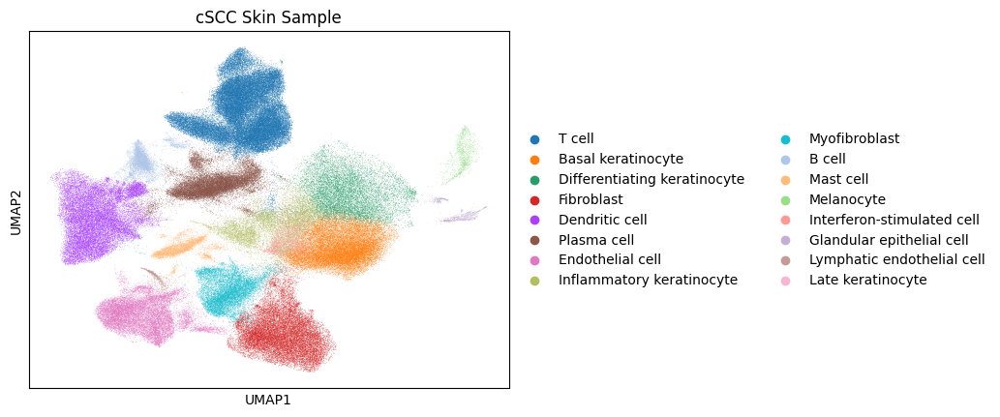

In [21]:
#Comparing umaps between normal samples and cSCC samples
adata_normal = adata[adata.obs['Condition']=='Normal'].copy()
adata_cSCC = adata[adata.obs['Condition']=='Tumor'].copy()

sc.pl.umap(adata_normal, color=['Cell_type'], title='Normal Skin Sample')
sc.pl.umap(adata_cSCC, color=['Cell_type'], title='cSCC Skin Sample')

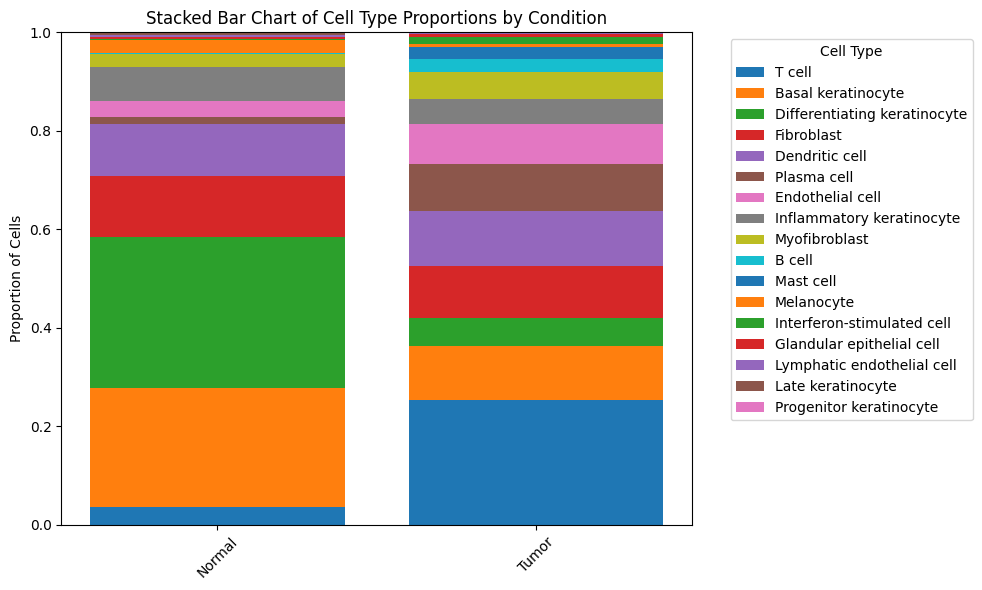

In [22]:
#Making plots to show the amount of expression for each cell type

cell_counts = adata.obs.groupby(['Cell_type', 'Condition']).size().reset_index(name='counts')
total_counts =adata.obs.groupby('Condition').size().reset_index(name="counts")

cell_counts = cell_counts.merge(total_counts, on='Condition')
cell_counts['proportion'] = cell_counts['counts_x']/cell_counts['counts_y']
cell_counts

import matplotlib.pyplot as plt

# Pivot the data: rows = Condition, columns = Cell_type, values = proportion
pivot_df = cell_counts.pivot(index='Condition', columns='Cell_type', values='proportion').fillna(0)

# Plot setup
fig, ax = plt.subplots(figsize=(10, 6))

# Plot stacked bars
bottom = None
for cell_type in pivot_df.columns:
    ax.bar(pivot_df.index, pivot_df[cell_type], label=cell_type, bottom=bottom)
    if bottom is None:
        bottom = pivot_df[cell_type]
    else:
        bottom += pivot_df[cell_type]

# Aesthetics
ax.set_ylabel('Proportion of Cells')
ax.set_title('Stacked Bar Chart of Cell Type Proportions by Condition')
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(False)
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()

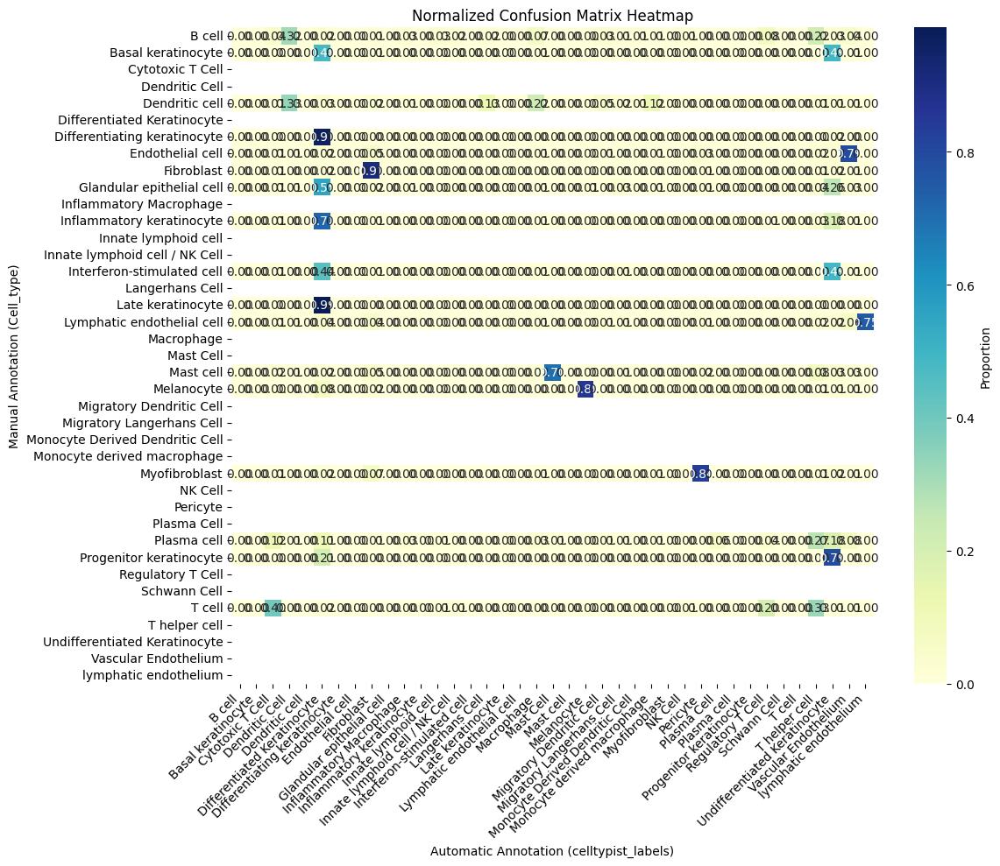

In [27]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Extract labels from AnnData object
manual_labels = adata.obs['Cell_type']
auto_labels = adata.obs['celltypist_labels']

# Get all unique label names from both columns
all_labels = sorted(set(manual_labels) | set(auto_labels))

# Compute confusion matrix
conf_mat = confusion_matrix(manual_labels, auto_labels, labels=all_labels)

# Normalize by row (manual labels)
conf_mat_normalized = conf_mat.astype('float') / conf_mat.sum(axis=1)[:, np.newaxis]

# Convert to DataFrame for plotting
conf_df = pd.DataFrame(conf_mat_normalized, index=all_labels, columns=all_labels)

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(conf_df, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={'label': 'Proportion'})
plt.xlabel('Automatic Annotation (celltypist_labels)')
plt.ylabel('Manual Annotation (Cell_type)')
plt.title('Normalized Confusion Matrix Heatmap')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## TSK score filtering

In [18]:
adata

AnnData object with n_obs × n_vars = 335125 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Condition', 'Patient_ID', 'level1_celltype', 'level2_celltype', 'level3_celltype', 'treatment', 'cluster', 'UMAP1', 'UMAP2', 'Dataset', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'doublet_scores', 'predicted_doublets', 'clusters_r06', 'clusters_r04', 'clusters_r02', 'original_barcodes', 'celltypist_labels', 'Cell_type', 'AUC_score', 'assignment'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'Condition_colors', 'Dataset_colors', 'Patient_ID_colors', 'batch_colors', 'celltypist_labels_colors', 'clu

In [51]:
sum(adata.obs['assignment'] == 'active')

8156

In [53]:
mask_active = adata.obs['assignment'] == 'active'
mask_keratinocyte = adata.obs['Cell_type'].str.contains('keratinocyte', regex=True, na=False)
mask_both = mask_active & mask_keratinocyte   #This will compare cells with active TSK score and cells which are keratinocytes
sum(mask_both) 
#6914 cells / 8156 total

6914

In [55]:
adata.obs['Cell_type'][adata.obs['assignment'] == 'active'].value_counts()

Cell_type
Basal keratinocyte              4819
Inflammatory keratinocyte       1434
Differentiating keratinocyte     661
Fibroblast                       461
Interferon-stimulated cell       290
Plasma cell                      162
Dendritic cell                    92
Endothelial cell                  82
Myofibroblast                     52
Mast cell                         32
Melanocyte                        31
Glandular epithelial cell         24
T cell                            14
Lymphatic endothelial cell         2
B cell                             0
Late keratinocyte                  0
Progenitor keratinocyte            0
Name: count, dtype: int64

In [56]:
celltypes = adata.obs['Cell_type'].unique()

for i in celltypes:
    print(i, "enrichment score:    ", adata.obs['AUC_score'][(adata.obs['assignment'] == 'active') & (adata.obs['Cell_type'].str.contains(i, regex=True, na=False))].mean())

Endothelial cell enrichment score:     0.3486957340615878
Inflammatory keratinocyte enrichment score:     0.3869980560357129
Fibroblast enrichment score:     0.3483814772318025
Basal keratinocyte enrichment score:     0.3752637765088481
Dendritic cell enrichment score:     0.35960214873258345
Melanocyte enrichment score:     0.3371528210237888
Myofibroblast enrichment score:     0.34215919215919216
T cell enrichment score:     0.3385548814120242
Differentiating keratinocyte enrichment score:     0.3421223254808731
Plasma cell enrichment score:     0.34770961437628106
Glandular epithelial cell enrichment score:     0.34897039897039894
Lymphatic endothelial cell enrichment score:     0.30733590733590754
Mast cell enrichment score:     0.3435328185328186
B cell enrichment score:     nan
Late keratinocyte enrichment score:     nan
Interferon-stimulated cell enrichment score:     0.34816668885634405
Progenitor keratinocyte enrichment score:     nan


In [19]:
adata.obs[(adata.obs['assignment'] == 'active')]

,orig.ident,nCount_RNA,nFeature_RNA,batch,Condition,Patient_ID,level1_celltype,level2_celltype,level3_celltype,treatment,...,doublet_scores,predicted_doublets,clusters_r06,clusters_r04,clusters_r02,original_barcodes,celltypist_labels,Cell_type,AUC_score,assignment
ACGATACTCGTCTGAA,SeuratProject,3507.0,1266.0,GSM6735856,Normal,P11,NaN,NaN,NaN,NaN,...,0.063223,False,2,3,2,ACGATACTCGTCTGAA,F3,Fibroblast,0.352896,active
CATCAAGAGTACGTTC,SeuratProject,1751.0,715.0,GSM6735856,Normal,P11,NaN,NaN,NaN,NaN,...,0.017649,False,3,4,3,CATCAAGAGTACGTTC,Macro_2,Dendritic cell,0.306564,active
CCCATACAGGGTGTTG,SeuratProject,6858.0,2057.0,GSM6735856,Normal,P11,NaN,NaN,NaN,NaN,...,0.013957,False,2,3,2,CCCATACAGGGTGTTG,F2,Fibroblast,0.312741,active
CCTATTAGTTCGCGAC,SeuratProject,17902.0,2654.0,GSM6735856,Normal,P11,NaN,NaN,NaN,NaN,...,0.048635,False,0,1,0,CCTATTAGTTCGCGAC,Undifferentiated_KC,Basal keratinocyte,0.312741,active
CGTCAGGGTAGGACAC,SeuratProject,882.0,496.0,GSM6735856,Normal,P11,NaN,NaN,NaN,NaN,...,0.098179,False,0,1,0,CGTCAGGGTAGGACAC,Differentiated_KC,Basal keratinocyte,0.386100,active
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTAGTCTAGGGACTGT-1,NaN,NaN,NaN,GSM5788503_S13_filtered_feature_bc_matrix,Normal,P27,NaN,NaN,NaN,NaN,...,0.026618,False,0,1,0,TTAGTCTAGGGACTGT-1,Differentiated_KC,Basal keratinocyte,0.302703,active
TTCATTGTCCGCAACG-1,NaN,NaN,NaN,GSM5788503_S13_filtered_feature_bc_matrix,Normal,P27,NaN,NaN,NaN,NaN,...,0.043570,False,1,2,0,TTCATTGTCCGCAACG-1,Differentiated_KC,Differentiating keratinocyte,0.321236,active
TTCGCTGTCTGTCAGA-1-1,NaN,NaN,NaN,GSM5788503_S13_filtered_feature_bc_matrix,Normal,P27,NaN,NaN,NaN,NaN,...,0.046659,False,1,2,0,TTCGCTGTCTGTCAGA-1,Differentiated_KC,Differentiating keratinocyte,0.318147,active
TTGGGTACAAGGACAC-1,NaN,NaN,NaN,GSM5788503_S13_filtered_feature_bc_matrix,Normal,P27,NaN,NaN,NaN,NaN,...,0.028346,False,0,1,0,TTGGGTACAAGGACAC-1,Differentiated_KC,Basal keratinocyte,0.301158,active


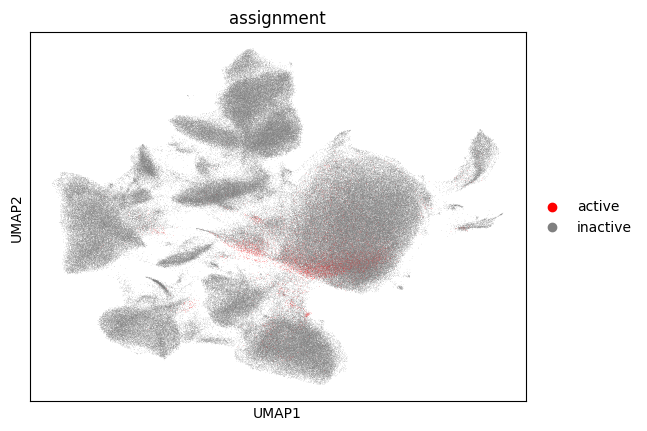

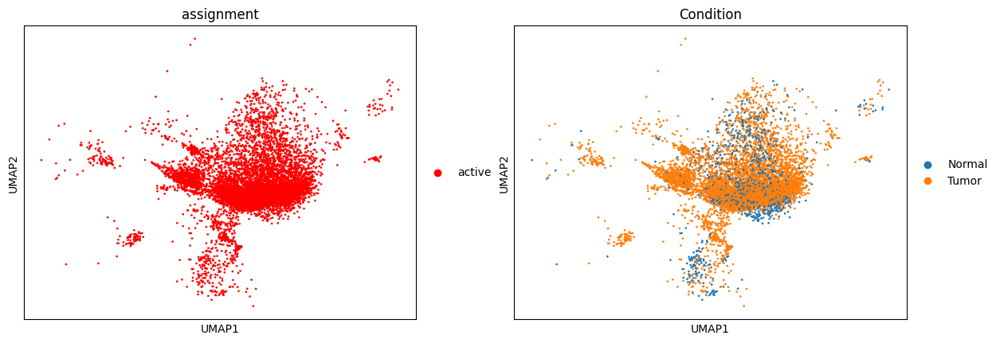

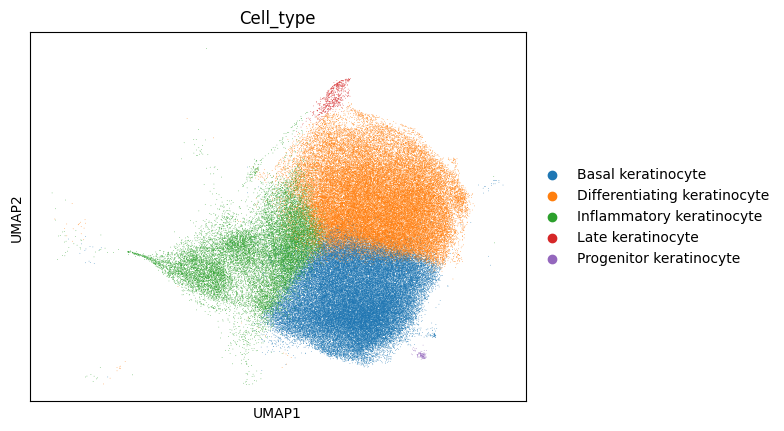

In [14]:
#Comparing TSK scores
sc.pl.umap(adata, color='assignment', groups=['inactive', 'active'], palette=['red', 'grey'])
sc.pl.umap(adata[adata.obs['assignment'] == 'active'], color=['assignment', 'Condition'])
sc.pl.umap(adata[adata.obs['Cell_type'].str.contains('keratinocyte', regex=True, na=False)],color='Cell_type')

In [57]:
Gene_set = (
  "MMP1", "LGALS1", "MMP10", "PTHLH", "ODC1", "LAMB3", "ITGB1", "LAMC2", "IGFBP6", "IGFBP2",
  "SERPINE2", "VIM", "ITGA6", "TGFBI", "MMP9", "SPRR1B", "PLAU", "TNC", "GJB6", "ACTB",
  "ANXA1", "KRT17", "OCIAD2", "NDUFA4L2", "EMP3", "LAMA3", "CAV1", "IL24", "NDRG1",
  "S100A6", "TMSB10", "S100A2", "CDKN2A", "SPINK6", "ANXA3", "PHLDA1", "ECM1",
  "SLC2A1", "TNFRSF12A"
)

In [59]:
sc.tl.score_genes(adata, Gene_set)

In [60]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,batch,Condition,Patient_ID,level1_celltype,level2_celltype,level3_celltype,treatment,...,predicted_doublets,clusters_r06,clusters_r04,clusters_r02,original_barcodes,celltypist_labels,Cell_type,AUC_score,assignment,score
AAACCTGAGAAACCTA,SeuratProject,2162.0,780.0,GSM6735856,Normal,P11,NaN,NaN,NaN,NaN,...,False,7,6,4,AAACCTGAGAAACCTA,VE1,Endothelial cell,0.044015,inactive,0.388986
AAACCTGAGCATCATC,SeuratProject,20485.0,2990.0,GSM6735856,Normal,P11,NaN,NaN,NaN,NaN,...,False,8,7,0,AAACCTGAGCATCATC,Differentiated_KC,Inflammatory keratinocyte,0.220077,inactive,0.716415
AAACCTGAGCGGATCA,SeuratProject,3853.0,1373.0,GSM6735856,Normal,P11,NaN,NaN,NaN,NaN,...,False,2,3,2,AAACCTGAGCGGATCA,F2,Fibroblast,0.000772,inactive,0.544831
AAACCTGAGCTCAACT,SeuratProject,20101.0,3951.0,GSM6735856,Normal,P11,NaN,NaN,NaN,NaN,...,False,2,3,2,AAACCTGAGCTCAACT,F2,Fibroblast,0.098842,inactive,0.660972
AAACCTGAGCTCCTTC,SeuratProject,1116.0,489.0,GSM6735856,Normal,P11,NaN,NaN,NaN,NaN,...,False,2,3,2,AAACCTGAGCTCCTTC,F2,Fibroblast,0.052510,inactive,0.351193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCAGTGTATC-1,NaN,NaN,NaN,GSM5788503_S13_filtered_feature_bc_matrix,Normal,P27,NaN,NaN,NaN,NaN,...,False,8,7,0,TTTGTTGCAGTGTATC-1,Differentiated_KC,Inflammatory keratinocyte,0.127413,inactive,0.054393
TTTGTTGGTCAGGTAG-1,NaN,NaN,NaN,GSM5788503_S13_filtered_feature_bc_matrix,Normal,P27,NaN,NaN,NaN,NaN,...,False,13,11,10,TTTGTTGGTCAGGTAG-1,Melanocyte,Melanocyte,0.176834,inactive,0.336665
TTTGTTGTCCCATTCG-1,NaN,NaN,NaN,GSM5788503_S13_filtered_feature_bc_matrix,Normal,P27,NaN,NaN,NaN,NaN,...,False,1,2,0,TTTGTTGTCCCATTCG-1,Differentiated_KC,Differentiating keratinocyte,0.159846,inactive,0.128651
TTTGTTGTCTCTATAC-1,NaN,NaN,NaN,GSM5788503_S13_filtered_feature_bc_matrix,Normal,P27,NaN,NaN,NaN,NaN,...,False,1,2,0,TTTGTTGTCTCTATAC-1,Differentiated_KC,Differentiating keratinocyte,0.094208,inactive,-0.025665


#### Threshold 0.5

In [61]:
### After changing threshold:
adata_T = sc.read("/data/BCI-SingleCell/SCC_Atlas/Sam_Nicholls/Combined_adata_object.h5ad")
TSK_UP_score = pd.read_csv("TSK_AUC_score_Threshold_UP.csv", index_col=0)
adata_T.obs = pd.concat([adata_T.obs, TSK_UP_score], axis=1)

In [62]:
sum(adata_T.obs['assignment'] == 'active')

484

In [75]:
adata[(adata.obs['Condition'] == 'Tumor') & (adata.obs['Cell_type'].str.contains('keratinocyte', case=False, regex=True, na=False))]

View of AnnData object with n_obs × n_vars = 46580 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Condition', 'Patient_ID', 'level1_celltype', 'level2_celltype', 'level3_celltype', 'treatment', 'cluster', 'UMAP1', 'UMAP2', 'Dataset', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'doublet_scores', 'predicted_doublets', 'clusters_r06', 'clusters_r04', 'clusters_r02', 'original_barcodes', 'celltypist_labels', 'Cell_type', 'AUC_score', 'assignment', 'score'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'Condition_colors', 'Dataset_colors', 'Patient_ID_colors', 'batch_colors', 'celltypist_labe

In [74]:
adata[(adata.obs['Cell_type'].str.contains('keratinocyte', case=False, regex=True, na=False))]

View of AnnData object with n_obs × n_vars = 121888 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Condition', 'Patient_ID', 'level1_celltype', 'level2_celltype', 'level3_celltype', 'treatment', 'cluster', 'UMAP1', 'UMAP2', 'Dataset', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'doublet_scores', 'predicted_doublets', 'clusters_r06', 'clusters_r04', 'clusters_r02', 'original_barcodes', 'celltypist_labels', 'Cell_type', 'AUC_score', 'assignment', 'score'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'Condition_colors', 'Dataset_colors', 'Patient_ID_colors', 'batch_colors', 'celltypist_lab

In [63]:
# After setting AUC active threshold to 0.5
adata_T.obs['Cell_type'][adata_T.obs['assignment'] == 'active'].value_counts()

Cell_type
Basal keratinocyte              299
Inflammatory keratinocyte       154
Interferon-stimulated cell       10
Differentiating keratinocyte      9
Fibroblast                        6
Plasma cell                       2
Dendritic cell                    2
Melanocyte                        1
Myofibroblast                     1
T cell                            0
Endothelial cell                  0
Mast cell                         0
B cell                            0
Glandular epithelial cell         0
Lymphatic endothelial cell        0
Late keratinocyte                 0
Progenitor keratinocyte           0
Name: count, dtype: int64

In [43]:
# Identify keratinocytes (case-insensitive match)
is_keratinocyte = adata.obs['Cell_type'].str.contains('keratinocyte', case=False, regex=True, na=False)

# Cells assigned as 'active' that arent keratinocytes
not_kc = (adata.obs['assignment'] == 'active') & (~is_keratinocyte)

# Set those cells to 'inactive'
adata.obs.loc[not_kc, 'assignment'] = 'inactive'


In [44]:
#Original 0.3 threshold data:
adata.obs['Cell_type'][adata.obs['assignment'] == 'active'].value_counts()

Cell_type
Basal keratinocyte              4817
Inflammatory keratinocyte       1434
Differentiating keratinocyte     661
T cell                             0
Fibroblast                         0
Dendritic cell                     0
Plasma cell                        0
Endothelial cell                   0
Myofibroblast                      0
B cell                             0
Mast cell                          0
Melanocyte                         0
Interferon-stimulated cell         0
Glandular epithelial cell          0
Lymphatic endothelial cell         0
Late keratinocyte                  0
Progenitor keratinocyte            0
Name: count, dtype: int64